In [60]:
#importing all required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.preprocessing import normalize
from imblearn.combine import SMOTEENN
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, mean_squared_error
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import RocCurveDisplay
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
import seaborn as sb
from sklearn.preprocessing import PolynomialFeatures

Classification: Credit Card Fraud

In [ ]:
df = pd.read_csv("creditcard.csv")

#removing infinite and NAN values
pd.set_option('mode.use_inf_as_na', True)
df.dropna(inplace = True)

df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [ ]:
#since class represents whether a transaction is fradulent X will be Class and Y will be everything else
Y = df['Class']
X = df[df.columns[0:30]]

#using combination of undersampling and oversampling to better balance the data
smk = SMOTEENN(random_state = 42)
X_new, Y_new = smk.fit_resample(X,Y)

#splitting training and test set into 60-40 ratio
X_train, X_test, y_train, y_test = train_test_split(X_new,Y_new, test_size = 0.4, random_state = 42)

First Classification Technique: Logistic Regression

In [ ]:
#scaling dataset using a Standard Scaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#use logistic regression
log_reg = LogisticRegression(solver = 'saga', random_state = 42, max_iter = 1000000)
log_reg.fit(X_train, y_train)

LogisticRegression(max_iter=1000000, random_state=42, solver='saga')

accuracy score:  0.98116458924298

precision score:  0.992062240933243

recall score:  0.9707723857573228

f1 score:  0.9813018533041649


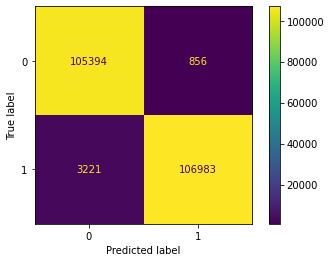

In [ ]:
#visualization

#1. confusion matrix

y_pred = log_reg.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm).plot()

print("accuracy score: ", accuracy_score(y_test, y_pred))
print("\nprecision score: ", precision_score(y_test, y_pred))
print ("\nrecall score: ", recall_score(y_test, y_pred))
print("\nf1 score: ", f1_score(y_test, y_pred))

In [ ]:
#decision function
y_scores = cross_val_predict(log_reg, X_train, y_train, cv = 3, method = "decision_function")
precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)

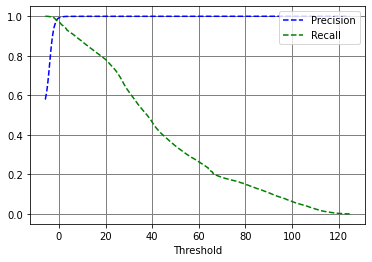

In [ ]:
#visualising precision and recall as a function of thresholds
def plot_precision_recall_vs_thresholds(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="Recall")
    plt.xlabel("Threshold")
    plt.legend(loc='upper right')
    plt.grid(b=True, which="both", axis="both", color='gray', linestyle='-', linewidth=1)

plot_precision_recall_vs_thresholds(precisions, recalls, thresholds)
plt.show()

In [ ]:
threshold_recall = thresholds[np.argmax(precisions >= 0.998)]
print(threshold_recall)

y_train_pred = (y_scores >= threshold_recall)

1.9975108776904413


accuracy score:  0.9735063031098217

precision score:  0.9980008123683075

recall score:  0.9499383819833752

f1 score:  0.9733766635716496





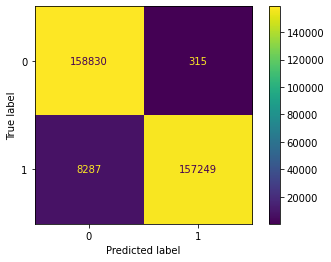

In [ ]:
#accuracy & precision metrics
print("accuracy score: ", accuracy_score(y_train, y_train_pred))
print("\nprecision score: ", precision_score(y_train, y_train_pred))
print ("\nrecall score: ", recall_score(y_train, y_train_pred))
print("\nf1 score: ", f1_score(y_train, y_train_pred))

#visualization with new confusion matrix
cm = confusion_matrix(y_train, y_train_pred)
print("\n\n")
disp = ConfusionMatrixDisplay(confusion_matrix=cm).plot()

2. Random Forest Classifier


In [ ]:
rnd_clf = RandomForestClassifier(n_estimators = 500, random_state = 42)
rnd_clf.fit(X_train, y_train)


RandomForestClassifier(n_estimators=500, random_state=42)

In [ ]:
#visualising one of our estimators
estimator = rnd_clf.estimators_[250]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = df.columns[0:30],
                class_names = df.columns[30],
                rounded = True, proportion = False, 
                precision = 3, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

accuracy score:  0.9998845020189047

precision score:  0.9998004046342415

recall score:  0.9999727777576132

f1 score:  0.9998865837669614


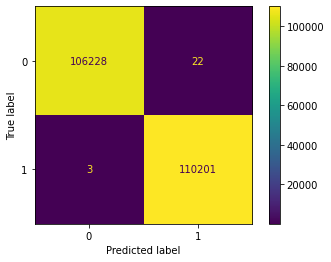

In [ ]:
y_pred_rfc = rnd_clf.predict(X_test)
print("accuracy score: ", accuracy_score(y_test, y_pred_rfc))
print("\nprecision score: ", precision_score(y_test, y_pred_rfc))
print ("\nrecall score: ", recall_score(y_test, y_pred_rfc))
print("\nf1 score: ", f1_score(y_test, y_pred_rfc))

cm = confusion_matrix(y_test, y_pred_rfc)
disp = ConfusionMatrixDisplay(confusion_matrix=cm).plot()


3. Support Vector Machine

In [ ]:
svm_clf = SVC(gamma = "scale", random_state= 42)
svm_clf.fit(X_train, y_train)

SVC(random_state=42)

accuracy score:  0.9949596681050015

precision score:  0.9978282491855934

recall score:  0.99225980908134

f1 score:  0.9950362386427228


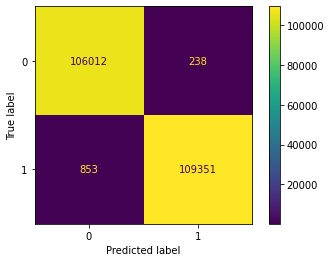

In [ ]:
y_pred_svm = svm_clf.predict(X_test)
print("accuracy score: ", accuracy_score(y_test, y_pred_svm))
print("\nprecision score: ", precision_score(y_test, y_pred_svm))
print ("\nrecall score: ", recall_score(y_test, y_pred_svm))
print("\nf1 score: ", f1_score(y_test, y_pred_svm))

cm = confusion_matrix(y_test, y_pred_svm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm).plot()

Regression: Energy Efficiency

In [19]:
df2 = pd.read_excel("ENB2012_data.xlsx")
df2

,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28
...,...,...,...,...,...,...,...,...,...,...
763,0.64,784.0,343.0,220.50,3.5,5,0.4,5,17.88,21.40
764,0.62,808.5,367.5,220.50,3.5,2,0.4,5,16.54,16.88
765,0.62,808.5,367.5,220.50,3.5,3,0.4,5,16.44,17.11
766,0.62,808.5,367.5,220.50,3.5,4,0.4,5,16.48,16.61


1. Ridge Regression

In [57]:
#then splitting it into input and output variables
X2 = df2[['X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X7', 'X8']]
Y2h = df2['Y1']
Y2c = df2['Y2']

#train-test-split
X_train_2h, X_test_2h, y_train_2h, y_test_2h = train_test_split(X2, Y2h, test_size=0.3)
X_train_2c, X_test_2c, y_train_2c, y_test_2c = train_test_split(X2, Y2c, test_size=0.3)

In [58]:
lin_reg_h = LinearRegression()
lin_reg_h.fit(X_test_2h, y_test_2h)
lin_reg_c = LinearRegression()
lin_reg_c.fit(X_test_2c, y_test_2c)

h_predict = lin_reg_h.predict(X_test_2h)
h_mse =  mean_squared_error(y_test_2h, h_predict, squared = True)
h_rmse = mean_squared_error(y_test_2h, h_predict, squared=False)
print("For heating load:\n")
print("mse: ", h_mse, "\nrmse: ", h_rmse, "\n\n")

c_predict = lin_reg_c.predict(X_test_2c)
c_mse =  mean_squared_error(y_test_2c, c_predict, squared = True)
c_rmse = mean_squared_error(y_test_2c, c_predict, squared=False)
print("For cooling load:\n")
print("mse: ", c_mse, "\nrmse: ", c_rmse)

For heating load:

mse:  8.882237700631206 
rmse:  2.980308323081893 


For cooling load:

mse:  8.047000034518728 
rmse:  2.8367234681087137


In [72]:
#performing the ridge regression

lin_ridge_h = Ridge(alpha= 0.001)
lin_ridge_h.fit(X_test_2h, y_test_2h)

lin_ridge_c = Ridge(alpha= 0.001)
lin_ridge_c.fit(X_test_2c, y_test_2c)

h_predict = lin_ridge_h.predict(X_test_2h)
h_mse =  mean_squared_error(y_test_2h, h_predict, squared = True)
h_rmse = mean_squared_error(y_test_2h, h_predict, squared=False)
print("For heating load:\n")
print("mse: ", h_mse, "\nrmse: ", h_rmse, "\n\n")

c_predict = lin_ridge_c.predict(X_test_2c)
c_mse =  mean_squared_error(y_test_2c, c_predict, squared = True)
c_rmse = mean_squared_error(y_test_2c, c_predict, squared=False)
print("For cooling load:\n")
print("mse: ", c_mse, "\nrmse: ", c_rmse)



For heating load:

mse:  8.849819096808213 
rmse:  2.97486455100198 


For cooling load:

mse:  8.027762514238296 
rmse:  2.833330639766262


regardless of alpha, mse and rmse are low enough that they can practically be considered 0, indicating that there is overfitting. to resolve this, I will reduce the number of features to the 2 with the highest correlation with heating load and cooling load, respectively

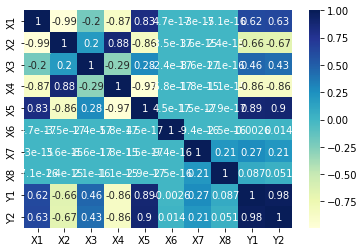

In [23]:
dataplot = sb.heatmap(df2.corr(), cmap="YlGnBu", annot=True)

As evidenced from the heatmap, the features most  correlated with Y1 (heat load) and Y2 (cooling load) are X4 and X5 because their absolute values are the greatest

In [55]:
input = df2[['X1', 'X2', 'X3', 'X6', 'X7', 'X8']]
input_train_h, input_test_h, y2_train_h, y2_test_h = train_test_split(input, Y2h, test_size=0.3, random_state = 42)
input_train_c, input_test_c, y2_train_c, y2_test_c = train_test_split(input, Y2c, test_size=0.3, random_state = 42)

h_ridge = Ridge(alpha = .01)
c_ridge = Ridge(alpha = .01)
h_ridge.fit(input_test_h, y2_test_h)
c_ridge.fit(input_test_c, y2_test_c)

h_predict = h_ridge.predict(input_test_h)
h_mse =  mean_squared_error(y2_test_h, h_predict, squared = True)
h_rmse = mean_squared_error(y2_test_h, h_predict, squared=False)
print("For heating load:\n")
print("mse: ", h_mse, "\nrmse: ", h_rmse, "\n\n")

c_predict = c_ridge.predict(input_test_c)
c_mse =  mean_squared_error(y2_test_c, c_predict, squared = True)
c_rmse = mean_squared_error(y2_test_c, c_predict, squared=False)
print("For cooling load:\n")
print("mse: ", c_mse, "\nrmse: ", c_rmse)


For heating load:

mse:  10.653755071803959 
rmse:  3.2640090489770337 


For cooling load:

mse:  12.29989964404758 
rmse:  3.507121275925254


Polynomial Regression

In [87]:
#degree 2
poly_features = PolynomialFeatures(degree=2, include_bias = False)
X_poly_h = poly_features.fit_transform(X_test_2h)
X_poly_c = poly_features.fit_transform(X_test_2c)

h_ridge.fit(X_poly_h, y_test_2h)
c_ridge.fit(X_poly_c, y_test_2c)

predict_h = h_ridge.predict(X_poly_h)
square_mse_h = mean_squared_error(y_test_2h, predict_h, squared = True)
square_rmse_h = mean_squared_error(y_test_2h, predict_h, squared=False)

predict_c = c_ridge.predict(X_poly_c)
square_mse_c = mean_squared_error(y_test_2c, predict_c, squared = True)
square_rmse_c = mean_squared_error(y_test_2c, predict_c, squared=False)

In [90]:
#degree 3
poly_features = PolynomialFeatures(degree=3, include_bias = False)
X_poly_h = poly_features.fit_transform(X_test_2h)
X_poly_c = poly_features.fit_transform(X_test_2c)

h_ridge.fit(X_poly_h, y_test_2h)
c_ridge.fit(X_poly_c, y_test_2c)

predict_h = h_ridge.predict(X_poly_h)
cube_mse_h = mean_squared_error(y_test_2h, predict_h, squared = True)
cube_rmse_h = mean_squared_error(y_test_2h, predict_h, squared=False)

predict_c = c_ridge.predict(X_poly_c)
cube_mse_c = mean_squared_error(y_test_2c, predict_c, squared = True)
cube_rmse_c = mean_squared_error(y_test_2c, predict_c, squared=False)

In [91]:
#degree 4
poly_features = PolynomialFeatures(degree=4, include_bias = False)
X_poly_h = poly_features.fit_transform(X_test_2h)
X_poly_c = poly_features.fit_transform(X_test_2c)

h_ridge.fit(X_poly_h, y_test_2h)
c_ridge.fit(X_poly_c, y_test_2c)

predict_h = h_ridge.predict(X_poly_h)
degreefour_mse_h = mean_squared_error(y_test_2h, predict_h, squared = True)
degreefour_rmse_h = mean_squared_error(y_test_2h, predict_h, squared=False)

predict_c = c_ridge.predict(X_poly_c)
degreefour_mse_c = mean_squared_error(y_test_2c, predict_c, squared = True)
degreefour_rmse_c = mean_squared_error(y_test_2c, predict_c, squared=False)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:197: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  "Singular matrix in solving dual problem. Using "
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:197: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  "Singular matrix in solving dual problem. Using "


In [92]:
#degree 5
poly_features = PolynomialFeatures(degree=5, include_bias = False)
X_poly_h = poly_features.fit_transform(X_test_2h)
X_poly_c = poly_features.fit_transform(X_test_2c)

h_ridge.fit(X_poly_h, y_test_2h)
c_ridge.fit(X_poly_c, y_test_2c)

predict_h = h_ridge.predict(X_poly_h)
degreefive_mse_h = mean_squared_error(y_test_2h, predict_h, squared = True)
degreefive_rmse_h = mean_squared_error(y_test_2h, predict_h, squared=False)

predict_c = c_ridge.predict(X_poly_c)
degreefive_mse_c = mean_squared_error(y_test_2c, predict_c, squared = True)
degreefive_rmse_c = mean_squared_error(y_test_2c, predict_c, squared=False)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:197: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  "Singular matrix in solving dual problem. Using "
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:197: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  "Singular matrix in solving dual problem. Using "


In [99]:
#degree 8
poly_features = PolynomialFeatures(degree=8, include_bias = False)
X_poly_h = poly_features.fit_transform(X_test_2h)
X_poly_c = poly_features.fit_transform(X_test_2c)

h_ridge.fit(X_poly_h, y_test_2h)
c_ridge.fit(X_poly_c, y_test_2c)

predict_h = h_ridge.predict(X_poly_h)
degreeeight_mse_h = mean_squared_error(y_test_2h, predict_h, squared = True)
degreeeight_rmse_h = mean_squared_error(y_test_2h, predict_h, squared=False)

predict_c = c_ridge.predict(X_poly_c)
degreeeight_mse_c = mean_squared_error(y_test_2c, predict_c, squared = True)
degreeeight_rmse_c = mean_squared_error(y_test_2c, predict_c, squared=False)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:197: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  "Singular matrix in solving dual problem. Using "
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:197: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  "Singular matrix in solving dual problem. Using "


In [94]:
#degree 10
poly_features = PolynomialFeatures(degree=2, include_bias = False)
X_poly_h = poly_features.fit_transform(X_test_2h)
X_poly_c = poly_features.fit_transform(X_test_2c)

h_ridge.fit(X_poly_h, y_test_2h)
c_ridge.fit(X_poly_c, y_test_2c)

predict_h = h_ridge.predict(X_poly_h)
degreeten_mse_h = mean_squared_error(y_test_2h, predict_h, squared = True)
degreeten_rmse_h = mean_squared_error(y_test_2h, predict_h, squared=False)

predict_c = c_ridge.predict(X_poly_c)
degreeten_mse_c = mean_squared_error(y_test_2c, predict_c, squared = True)
degreeten_rmse_c = mean_squared_error(y_test_2c, predict_c, squared=False)

In [98]:
#comparing metrics
print("Degree = 2:\n")
print("Heating: \n")
print("mse: ", square_mse_h, "\nrmse: ", square_rmse_h, "\n")
print("Cooling: \n")
print("mse: ", square_mse_c, "\nrmse: ", square_rmse_c, "\n")

print("-------------------------------------------------------------------")

print("Degree = 3:\n")
print("Heating: \n")
print("mse: ", cube_mse_h, "\nrmse: ", cube_rmse_h, "\n")
print("Cooling: \n")
print("mse: ", cube_mse_c, "\nrmse: ", cube_rmse_c)

print("-------------------------------------------------------------------")

print("\nDegree = 4:\n")
print("Heating: \n")
print("mse: ", degreefour_mse_h, "\nrmse: ", degreefour_rmse_h, "\n")
print("Cooling: \n")
print("mse: ", degreefour_mse_c, "\nrmse: ", degreefour_rmse_c)

print("-------------------------------------------------------------------")

print("\nDegree = 5:\n")
print("Heating: \n")
print("mse: ", degreefive_mse_h, "\nrmse: ", degreefive_rmse_h, "\n")
print("Cooling: \n")
print("mse: ", degreefive_mse_c, "\nrmse: ", degreefive_rmse_c)

print("-------------------------------------------------------------------")

print("\nDegree = 8:\n")
print("Heating: \n")
print("mse: ", degreeeight_mse_h, "\nrmse: ", degreeeight_rmse_h, "\n")
print("Cooling: \n")
print("mse: ", degreeeight_mse_c, "\nrmse: ", degreeeight_rmse_c)

print("-------------------------------------------------------------------")

print("\nDegree = 10:\n")
print("Heating: \n")
print("mse: ", degreeten_mse_h, "\nrmse: ", degreeten_rmse_h, "\n")
print("Cooling: \n")
print("mse: ", degreeten_mse_c, "\nrmse: ", degreeten_rmse_c, "\n")

Degree = 2:

Heating: 

mse:  2.234470896708472 
rmse:  1.4948146696860023 

Cooling: 

mse:  3.9955291174592404 
rmse:  1.9988819668652875 

-------------------------------------------------------------------
Degree = 3:

Heating: 

mse:  0.1858926428557722 
rmse:  0.4311526908831397 

Cooling: 

mse:  1.1671215767898735 
rmse:  1.080334011678737
-------------------------------------------------------------------

Degree = 4:

Heating: 

mse:  0.5328945809838199 
rmse:  0.7299962883356462 

Cooling: 

mse:  1.6216187677147174 
rmse:  1.2734279593737203
-------------------------------------------------------------------

Degree = 5:

Heating: 

mse:  0.533673927297389 
rmse:  0.7305298948690526 

Cooling: 

mse:  1.772104700765512 
rmse:  1.3312042295476347
-------------------------------------------------------------------

Degree = 8:

Heating: 

mse:  2.7295682540856747 
rmse:  1.6521405067625679 

Cooling: 

mse:  2.384349265598429 
rmse:  1.5441338237336908
-----------------------